<a href="https://colab.research.google.com/github/lancia1944179-cyber/Koopman_SHRED_Epilepsy/blob/main/Koopman_SHRED.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Interpretable Data driven Sparse Identification of Epileptic neural dynamics
*Mattia Lancia - Department of Computer, Control and Management Engineering of the University of Rome La Sapienza*

## Section 0. Installation and enviromental procedures

### 0.1. Necessary Installations

**Install Torch + Cuda (for GPU enviroment support)**

In [ ]:
!pip install torch==2.0.0+cu117 torchvision==0.15.0+cu117 torchaudio==2.0.0 --index-url https://download.pytorch.org/whl/cu117

^C


**Verify git version**

In [ ]:
!git --version

**Install SINDy-SHRED from github**

In [ ]:
# Clone GitHub repository
!git clone https://github.com/gaoliyao/sindy-shred.git
# Install SINDy-SHRED
!pip install pysindy==1.7.5 numpy==1.23.5 scipy==1.13.1 scikit-learn==1.5.2

In [ ]:
!pip install mne pandas numpy

### 0.2 Necessary Imports

**Import the necessary python resources for the entire code**

In [ ]:
# Utility imports
import numpy as np
import torch

%cd sindy-shred
from processdata import load_data
from processdata import TimeSeriesDataset
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import pickle
import pandas as pd
import random

# GPU cuda support
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"
device = 'cuda' if torch.cuda.is_available() else 'cpu'
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "max_split_size_mb:64"

# SINDy_SHRED import
import sindy
import sindy_shred
import pysindy as ps

# .edf-.csv manipulation
import glob
from collections import defaultdict
import mne

# Time tracking for excecution
import time

# Plot and Math
import math
np.math = math
import matplotlib.pyplot as plt

# Metrics and Machine learning utilities
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import mean_squared_error, mean_absolute_error, median_absolute_error, explained_variance_score, r2_score

C:\Users\mlanc\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


C:\Users\mlanc\sindy-shred


## Section 1. Data preparation

### 1.1 Data Formatting

The paper of reference implied the real time analysis on the iEEG signals of an unspecified patient from the dataset, having 84 good channels, over which assemble respectively the training/validation and test set. This script serves the purpose to find that patient among the iEEGs.

In [ ]:
files = glob.glob("G:\Il mio Drive\Control Engineering\CSB\iEEG\sub-" +           # Match all channels.tsv files in the data folder
                  "*/**/*channels.tsv", recursive=True)                           # ...
subject_runs = defaultdict(list)                                                  # Dictionary to group good-channel counts by subject

for file in files:                                                                # For each file in the dataset ...
    df = pd.read_csv(file, sep='\t')                                              # ... read the .csv
    subject = file.split(os.sep)[0]                                               # ... retrieve the patient
    run = os.path.basename(file).replace("_channels.tsv", "")                     # ... retrieve the related tsv

    if 'status' in df.columns:                                                    # ... If the status column exists ...
        good_channels = df[df['status'].str.lower() == 'good']                    # ...... filter the good channels only
    else:                                                                         # ... Else ...
        good_channels = df                                                        # ... assume all channels are good
    if len(good_channels) == 84:                                                  # ... If the number of the good channels is 84
        subject_runs[subject].append(run)                                         # ...... memorize the patient

for subject, runs in subject_runs.items():                                        # For each patient and runs ...
    print(f"{subject} has 84 good channels: {runs}")                              # ...... print the found patients

G: has 84 good channels: ['sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01', 'sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-02', 'sub-HUP087_ses-presurgery_task-interictal_acq-ecog_run-01', 'sub-HUP087_ses-presurgery_task-interictal_acq-ecog_run-02']


**std_edf**. A load function which provides the conversion of the edf to a data-permanence purpose csv, in order to be later red by torch utilities and build the sets.

In [ ]:
def std_edf(path):
  """
    Load and process EDF iEEG data using MNE: centers the signal, converts from
    DataFrame to .csv, then saves the file locally.

    Args:
      path (String): full path to the edf file.

    Returns:
      iEEG_table (csv): csv table from the selected edf file.
      time (numpy)
  """

  # DATA RETRIEVAL -------------------------------------------------------------

  raw = mne.io.read_raw_edf(edf_path, preload=True, verbose=False)                # Reads the target .edf file
  all_channels = raw.ch_names                                                     # List of all channels

  base_dir = os.path.dirname(edf_path)                                            # Try to locate the corresponding BIDS channels.tsv file
  base_name = os.path.basename(edf_path).replace('_ieeg.edf', '')                 # ...
  tsv_path = os.path.join(base_dir, base_name + '_channels.tsv')                  # ...

  if os.path.exists(tsv_path):                                                    # If the channels.tsv file exists ...
      channels_info = pd.read_csv(tsv_path, sep='\t')                             # ... read it
      good_channels = channels_info.loc[(channels_info['status'].str.lower()      # ... filter only the good channels and merge them to a list
        =='good'), 'name'].tolist()                                               # ...
      raw.pick_channels(good_channels)                                            # ...
  else:                                                                           # ... Else ...
      good_channels = all_channels                                                # ... assume all channels are good

  # DATA FORMATTING ------------------------------------------------------------

  data, times = raw.get_data(return_times=True)                                   # Extract and center data
  data -= np.mean(data, axis=1, keepdims=True)                                    # ...

  # DATA PERSISTANCE -----------------------------------------------------------

  iEEG_table = pd.DataFrame(data.T, columns=raw.ch_names)                         # Convert the iEEG in pandas DataFrame
  save_dir = rf'C:\Users\mlanc\Desktop\KoopmanDataMaintainance\Datasets\{patient}'# Select the saving directory (default)
  os.makedirs(save_dir, exist_ok=True)                                            # Convert to .csv and save
  csv_path = os.path.join(save_dir, f"{file}.csv")                                # ...
  iEEG_table.to_csv(csv_path, index=False)                                        # ...
  print(f"Saved table with shape {iEEG_table.shape} to:\n{csv_path}")             # ...

  # ----------------------------------------------------------------------------

  return iEEG_table, times, raw.ch_names

**Source file formatting**

In [ ]:
file = 'sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg'
patient = file.split('_')[0]
edf_path = rf'G:\Il mio Drive\Control Engineering\CSB\iEEG\sub-HUP087\ses-presurgery\ieeg\{file}.edf'
iEEG_table = std_edf(edf_path)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Saved table with shape (109568, 84) to:
C:\Users\mlanc\Desktop\KoopmanDataMaintainance\Datasets\sub-HUP087\sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.csv


### 1.2. Datasets assembly

**datasetPrep**. This custom function collect specified iEEG datas, standardly collected in a drive folder with the help of a matlab function, in order to initialize the necessary variables and datasets.

Due to the large use of resources involved, which would later consume the available GPU space, a data persistance approach has been provided, with standardized and organized save paths in torch medium (unfortunately, due to the custom nature of the SINDy learning procedure, no checkpoint can be created during data training).

In [ ]:
def datasetPrep(trainD, testD, time_length, time_lags):
  """
    Prepares the train and validation dataset from the specificated source, and extrapolate from test dataset.

    Args:
      trainD (String): full path to the train dataset, from which extrapolate train and validation datasets.
      testD (String): full path to the test dataset.
      time_length(int): data sampling duration to be considered on the trainD alone.
      time_lags(int): interval of past data samplings to consider for time series forecasting.

    Both trainD and testD are two round of interictal measurements from the same patient, compressed from the matlab script; in every case, all iEEG channels are considered.

    Returns:
      train_dataset (TimeSeriesDataset): train dataset.
      validation_dataset (TimeSeriesDataset): validation dataset.
      test_dataset (TimeSeriesDataset): test dataset.
      train_table.values (): original train table in array format.
      test_table.values (): original test table in array format.
      X.shape (): data dimension.
      sc (): data normalization scaler.
  """

  # DATA INITIALIZATION --------------------------------------------------------

  train_table = pd.read_csv(trainD)                                               # Take table files from drive
  test_table = pd.read_csv(testD)                                                 # ...

  X = train_table.values                                                          # Converts DataFrame to NumPy arrays
  Y = test_table.values                                                           # ...

  train_length = int((time_length - time_lags)*80/100)                            # Calculate train-validation length (80:20 split)
  validation_length = (time_length - time_lags) - train_length                    # ...
  test_length = time_length - time_lags                                           # Calculate test length
  test_length = 45000 #10000                                                      # OVERRIDE LETS TRY LESS TO AVOID CUDA OUT OF MEMORY

  train_indices = np.arange(0, train_length)                                      # Train-Validation indices
  validation_indices = np.arange(train_length, train_length + validation_length)  # ...
  test_indices = np.arange(0, test_length)                                        # Test indices

  sc = MinMaxScaler()                                                             # Data normalization scaler
  sc = sc.fit(X[train_indices])                                                   # ...
  X_norm = sc.transform(X)                                                        # ...
  Y_norm = sc.transform(Y)                                                        # ...

  # DATASETS CONSTRUCTIONS -----------------------------------------------------

  train_validation_data = (                                                       # Pre-allocate train-validation sequence, reserving space for the time lags at each point
    np.zeros((time_length-time_lags, time_lags, X.shape[1])))                     # ...
  for i in range(len(train_validation_data)):                                     # For each element of the train-validation set ...
    train_validation_data[i] = X_norm[i:i + time_lags, np.arange(0, X.shape[1])]  # ... fill it with the normalized values

  test_data = np.zeros((time_length - time_lags, time_lags, Y.shape[1]))          # Pre-allocate test data sequence, reserving space for the time lags at each point
  for i in range(len(test_data)):                                                 # For each element of the test set ...
    test_data[i] = Y_norm[i:i + time_lags, np.arange(0, Y.shape[1])]              # ... fill it with the normalized values

  train_data_in = torch.tensor(train_validation_data[train_indices],              # Allocate INPUT training validation and test datasets datas, with their respective indices, to the cuda-imported device
                               dtype=torch.float32).to(device)                    # ...
  validation_data_in = torch.tensor(train_validation_data[validation_indices],    # ...
                                    dtype=torch.float32).to(device)               # ...
  test_data_in = torch.tensor(test_data[test_indices],                            # ...
                              dtype=torch.float32).to(device)                     # ...

  train_data_out = torch.tensor(X_norm[train_indices + time_lags - 1],            # Allocate OUTPUT training validation and test datasets datas, with their respective indices, to the cuda-imported device
                                dtype=torch.float32).to(device)                   # ...
  validation_data_out = torch.tensor(X_norm[validation_indices + time_lags - 1],  # ...
                                     dtype=torch.float32).to(device)              # ...
  test_data_out = torch.tensor(Y_norm[test_indices + time_lags - 1],              # ...
                               dtype=torch.float32).to(device)                    # ...

  train_dataset = TimeSeriesDataset(train_data_in, train_data_out)                # Convert the train, validation and test sets in formal TimeSeries (for later use with torch)
  validation_dataset = TimeSeriesDataset(validation_data_in,                      # ...
                                         validation_data_out)                     # ...
  test_dataset = TimeSeriesDataset(test_data_in, test_data_out)                   # ...

  # DATA PERSISTANCE -----------------------------------------------------------

  patient = trainD.rsplit('\\')                                                   # Prepare the general paths
  patient = patient[len(patient) - 2]                                             # ...
  train_dataset_path = trainD.rsplit('\\')[-1].rsplit('.csv')[0]                  # ...
  test_dataset_path = testD.rsplit('\\')[-1].rsplit('.csv')[0]                    # ...

  path = ("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\" +      # Set folder path
         patient + "\\")                                                          # ...

  train_path = (path + "\\train_dataset_pickle___" + str(train_length) + "___"    # Train, validation and test path (<path>\\<type>_dataset_pickle_<type_length>_<time_lags>_from_<dataset>.pkl)
               + str(time_lags) + "___from___" + train_dataset_path +".pkl")      # ...
  validation_path = (path + "\\validation_dataset_pickle___"                      # ...
                    + str(validation_length) + "___" + str(time_lags)             # ...
                    + "___from___" + train_dataset_path +".pkl")                  # ...
  test_path = (path + "\\test_dataset_pickle___" + str(test_length) + "___"       # ...
              + str(time_lags) + "___from___" + test_dataset_path +".pkl")        # ...

  sc_path = path + "\\sc_for_dataset.pkl"                                         # Scaler path

  with open(train_path, 'wb') as f:                                               # Save the train, validation and test datasets and the scaler in torch format
      torch.save(train_dataset, f)                                                # ...
  print("Train TimeSeriesDataset saved with TORCH at: " + train_path)             # ... with output
  with open(validation_path, 'wb') as f:                                          # ...
      torch.save(validation_dataset, f)                                           # ...
  print("Validation TimeSeriesDataset with TORCH saved at: " + validation_path)   # ... with output
  with open(test_path, 'wb') as f:                                                # ...
      torch.save(test_dataset, f)                                                 # ...
  print("Test TimeSeriesDataset saved with TORCH at: " + test_path)               # ... with output
  with open(sc_path, 'wb') as f:                                                  # ...
      torch.save(sc, f)                                                           # ...
  print("Sc regulator saved with TORCH at: " + sc_path)                           # ... with output

  # ----------------------------------------------------------------------------

  return train_dataset, validation_dataset, test_dataset, train_table.values, test_table.values, X.shape, sc

**Datasets construction (only on new experiment or first time)**

In [ ]:
trainD = "C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.csv"
testD = "C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-02_ieeg.csv"
train_length = 50000
time_lags = 100

train_dataset, validation_dataset, test_dataset, train_table, test_table, data_dimension, sc = datasetPrep(trainD, testD, train_length, time_lags)

Train TimeSeriesDataset saved with TORCH at: C:\Users\mlanc\Desktop\KoopmanDataMaintainance\Datasets\sub-HUP087\\train_dataset_pickle___39920___100___from___sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.pkl
Validation TimeSeriesDataset with TORCH saved at: C:\Users\mlanc\Desktop\KoopmanDataMaintainance\Datasets\sub-HUP087\\validation_dataset_pickle___9980___100___from___sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.pkl
Test TimeSeriesDataset saved with TORCH at: C:\Users\mlanc\Desktop\KoopmanDataMaintainance\Datasets\sub-HUP087\\test_dataset_pickle___45000___100___from___sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-02_ieeg.pkl
Sc regulator saved with TORCH at: C:\Users\mlanc\Desktop\KoopmanDataMaintainance\Datasets\sub-HUP087\\sc_for_dataset.pkl


**Datasets retrieval**

In [ ]:
with open('C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\train_dataset_pickle___39920___100___from___sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.pkl', 'rb') as f:
    train_dataset = torch.load(f)
with open('C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\validation_dataset_pickle___9980___100___from___sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-01_ieeg.pkl', 'rb') as f:
    validation_dataset = torch.load(f)
with open('C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\test_dataset_pickle___45000___100___from___sub-HUP087_ses-presurgery_task-ictal_acq-ecog_run-02_ieeg.pkl', 'rb') as f:
    test_dataset = torch.load(f)
with open('C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\sc_for_dataset_pickle.pkl', 'rb') as f:
    sc = torch.load(f)

## Section 2. Model definition and Training

### 2.1. Model and training Parameters

The following code will provide SINDy-SHRED training and SINDy model fitting, by use of certain parameters described below

**SINDy parameters**

In [ ]:
latent_dim = 140                                                                  # Values: 26, 84, 140

SINDY_library_params = {
    "poly_order": 1,
    "use_sine": False,
    "n": latent_dim,
    "include_constant": True
}

SINDY_params = {
    "poly_order": 1,
    "include_sine": False,
}

**SHRED net parameters**

In [ ]:
SHRED_params = {
    "input_size": 84,
    "output_size": 84,
    "hidden_layers": 2,
    "hidden_size": latent_dim,
    "dropout": 0.1,
    "layer_norm": False,
    "l1": 350,
    "l2": 400,
    "dt": 1/512
}

**Training parameters**

In [ ]:
fit_params = {
    "model": None,
    "train_dataset": train_dataset,
    "valid_dataset": validation_dataset,
    "batch_size": 1000,                                                         # Values: 100-1000
    "num_epochs": 200,
    "lr": 1.5e-3,
    "verbose": True,
    "threshold": 0.25,
    "patience": 5,
    "sindy_regularization": 10.0,
    "optimizer": "AdamW",
    "thres_epoch": 100
}

### 2.2. SINDy-SHRED definition and training

**SS_training**. Function responsible for the training process of the SINDy-SHRED network by use of the preceeding cited parameters. It then saves the torch compression of the network locally.

In [ ]:
def SS_training(SINDy_library_params, SINDy_params, SHRED_params, fit_params, path):
  """
    SINDy-SHRED training and data permanence procedure

      Args:
        SINDy_params (dict): SINDy latent space parameters.
        SHRED_params (dict): SHRED network parameters.
        fit_params (dict): training parameters.
        path (String): path to save the trained model.

      Returns:
        shred (SINDy_SHRED): trained SINDy-SHRED model.
  """

  SINDY_params["library_dim"]= sindy.library_size(**SINDY_library_params)         # Automatic SINDy library dimension calculator

  shred = sindy_shred.SINDy_SHRED(**SHRED_params, **SINDy_params).to(device)      # SINDy-SHRED definition, allocated to the cuda-specified device

  fit_params["model"] = shred                                                     # ...
  validation_errors = sindy_shred.fit(**fit_params)                               # SINDy-SHRED training

  # DATA PERSISTANCE -----------------------------------------------------------

  x, y = fit_params["train_dataset"][0]
  nsensor = x.shape[1]

  shred_path = (path + "\\shred___"                                               # Trained shred path
               + str(nsensor) + "___"                                             # ...
               + str(SHRED_params["hidden_layers"]) + "___"                       # ...
               + str(SHRED_params["hidden_size"]) + "___"                         # ...
               + str(SHRED_params["dropout"]) + "___"                             # ...
               + str(SHRED_params["layer_norm"]) + "___"                          # ...
               + str(SHRED_params["l1"]) + "___"                                  # ...
               + str(SHRED_params["l2"]) + "___"                                  # ...
               + str(SHRED_params["dt"]) + "___"                                  # ...
               + str(SHRED_params["layer_norm"]) + "___"                          # ...
               + str(fit_params["batch_size"]) + "___"                            # ...
               + str(fit_params["num_epochs"]) + "___"                            # ...
               + str(fit_params["lr"]) + "___"                                    # ...
               + str(fit_params["threshold"]) + "___"                             # ...
               + str(fit_params["patience"]) + "___"                              # ...
               + str(fit_params["sindy_regularization"]) + "___"                  # ...
               + str(fit_params["optimizer"]) + "___"                             # ...
               + str(fit_params["thres_epoch"]) + "___" +".pkl")                  # ...

  with open(shred_path, 'wb') as f:                                               # Save the trained model in torch format
      torch.save(shred, f)                                                        # ...

  # ----------------------------------------------------------------------------

  return shred

**SINDy-SHRED training (only on new experiment or first time)**

In [ ]:
start = time.time()
shred = SS_training(SINDY_library_params, SINDY_params, SHRED_params, fit_params, 'C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087')
end = time.time()
print(f"⏱️ Took {end - start:.2f} seconds")

1 : tensor(0.0093, device='cuda:0', grad_fn=<AddBackward0>)
2 : tensor(0.0082, device='cuda:0', grad_fn=<AddBackward0>)
3 : tensor(0.0080, device='cuda:0', grad_fn=<AddBackward0>)
4 : tensor(0.0068, device='cuda:0', grad_fn=<AddBackward0>)
5 : tensor(0.0062, device='cuda:0', grad_fn=<AddBackward0>)
6 : tensor(0.0058, device='cuda:0', grad_fn=<AddBackward0>)
7 : tensor(0.0053, device='cuda:0', grad_fn=<AddBackward0>)
8 : tensor(0.0054, device='cuda:0', grad_fn=<AddBackward0>)
9 : tensor(0.0048, device='cuda:0', grad_fn=<AddBackward0>)
10 : tensor(0.0046, device='cuda:0', grad_fn=<AddBackward0>)
11 : tensor(0.0044, device='cuda:0', grad_fn=<AddBackward0>)
12 : tensor(0.0042, device='cuda:0', grad_fn=<AddBackward0>)
13 : tensor(0.0042, device='cuda:0', grad_fn=<AddBackward0>)
14 : tensor(0.0040, device='cuda:0', grad_fn=<AddBackward0>)
15 : tensor(0.0040, device='cuda:0', grad_fn=<AddBackward0>)
16 : tensor(0.0038, device='cuda:0', grad_fn=<AddBackward0>)
17 : tensor(0.0036, device='cuda:

**SINDy-SHRED retrieval**

In [ ]:
with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\shred___84___2___140___0.1___False___350___400___0.001953125___False___1000___200___0.0015___0.25___5___10.0___AdamW___100___.pkl", 'rb') as f:
    shred = torch.load(f)

## Section 3. Symbolic model equations extrapolation

With the following code, the full stack process of SINDy model fitting is provided, regressing the Koopman operator from the GRU states of the trained SHRED network.

**shred_forward_memory_friendly**. Given the enormous strain required for GRU traversing with high magnitude of datas, an altered version of the forward pass of the SHRED net is provided, assemblying batches of propagated data.

In [ ]:
def shred_forward_memory_friendly(shred, dataset, batch_size=32):
  gru_outs_list = []                                                              # Pre-allocate the output list

  with torch.no_grad():                                                           # Do not compute gradients (to lighten the process)
      for i in range(0, len(dataset), batch_size):                                # For each batched subsection of the input data to transform ...
          batch = dataset[i:i+batch_size]                                         # ... define the current batch datas
          out, _ = shred.gru_outputs(batch, sindy=True)                           # ... forward push the batch datas
          out = out[:,0,:]                                                        # ... collect only the first replicate
          gru_outs_list.append(out.cpu())                                         # ... append the transformed batched to the output list

  gru_outs_train = torch.cat(gru_outs_list, dim=0)                                # Concatenate every batched subsection

# ------------------------------------------------------------------------------

  return gru_outs_train

**SINDy_discovery**. This is the core of the model fitting algorithm, where the model parameters are set and symbolic equations are regressed.

In [ ]:
def SINDy_discovery(shred, poly_order, threshold, alpha, t_sim_span, diff_method, stamp, path):
  """
    SINDy-SHRED symbolic model discovery of the latent space

    Args:
      shred (sindy_shred): SINDy-SHRED model.
      threshold (float): SINDy-SHRED threshold value.
      alpha (float): SINDy-SHRED alpha value.
      t_sim_span (int): SINDy-SHRED simulation time span.
      diff_method (str): SINDy-SHRED differentiation method.
      stamp (bool): SINDy-SHRED print flag. If True, it will print the
        discovered model, the true and simulated signals, and the true and
        simulated latent states alike.

    Returns:
      model (pysindy): SINDy model of symbolic differential equations.
  """

  gru_outs_train = shred_forward_memory_friendly(shred, train_dataset.X)          # Propagate the train datas in latent space through GRUs section
  latent_dim = gru_outs_train.shape[1]                                            # Retrieve number of hidden states
  gru_outs_train = gru_outs_train.detach().cpu().numpy()                          # Convert in numpy

  # SINDy DISCOVERY ------------------------------------------------------------

  if diff_method == "finite":                                                     # Define the differentiation method for equation settings. For noisy signals, SmoothedFiniteDifference is technically a better option
    differentiation_method = ps.differentiation.FiniteDifference()                # ...
  else:                                                                           # ...
    differentiation_method = ps.differentiation.SmoothedFiniteDifference()        # ...

  sindy = ps.SINDy(                                                               # Define the model
      optimizer = ps.STLSQ(threshold = threshold, alpha = alpha),                 # ... through Sparse Thresholded Least Squares method with given alpha and threshold
      feature_library = ps.PolynomialLibrary(degree = poly_order),                # ... of the same polynomial order library as the trained shred (1 for linearity)
      differentiation_method = differentiation_method                             # ... with the set differentiation method
  )                                                                               # ...

  t_points = np.arange(0, gru_outs_train.shape[0])*(1/512.0)                      # Define the time span of the discovery, alias a time vector from 0 to the number of points in the set, with a set dt
  sindy.fit(gru_outs_train, t = t_points)                                         # Fit the model

  # DISCOVERED SINDy MODEL PLOT ------------------------------------------------

  if stamp:                                                                       # If stamp is True ...
    sindy.print()                                                                 # ... print the symbolic differential equations

  sindy_path = (path + "\\sindy_model___"                                         # Trained shred path
              + str(latent_dim) + "___STLSQ___"                                   # ...
              + str(threshold) + "___"                                            # ...
              + str(alpha) + "___"                                                # ...
              + str(differentiation_method) + "___" + ".pkl")                     # ...

  with open(sindy_path, 'wb') as f:                                               # Save the trained model in torch format
    torch.save(sindy, f)                                                          # ...

  # ----------------------------------------------------------------------------

  return sindy

**SINDy model regression (only on new experiment or first time)**

In [ ]:
model = SINDy_discovery(shred, 1, 0.0, 0.02, 15, "finite", True, 'C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087')

(x0)' = 2.045 1 + 126.272 x0 + -7.419 x1 + -62.653 x2 + -24.391 x3 + -91.065 x4 + 95.716 x5 + 32.584 x6 + 0.046 x7 + -76.777 x8 + -2.229 x9 + -46.369 x10 + -105.868 x11 + -100.746 x12 + 19.589 x13 + -46.737 x14 + -114.633 x15 + 74.051 x16 + -49.258 x17 + 48.829 x18 + -60.012 x19 + -6.820 x20 + 16.359 x21 + 10.884 x22 + -6.931 x23 + 48.457 x24 + 39.664 x25 + 97.383 x26 + 45.932 x27 + -123.379 x28 + 7.074 x29 + 30.128 x30 + -45.840 x31 + 1.307 x32 + 1.188 x33 + -93.815 x34 + -9.930 x35 + -10.010 x36 + -75.112 x37 + -20.624 x38 + 16.145 x39 + -121.354 x40 + -42.266 x41 + -29.828 x42 + -17.760 x43 + 21.921 x44 + 89.199 x45 + -38.373 x46 + 112.334 x47 + 117.102 x48 + 24.510 x49 + 6.295 x50 + 80.871 x51 + -95.961 x52 + 130.135 x53 + 10.345 x54 + -3.355 x55 + -28.467 x56 + 3.434 x57 + -34.506 x58 + 55.480 x59 + 176.352 x60 + 82.693 x61 + -71.243 x62 + 116.560 x63 + 19.181 x64 + 1.463 x65 + 159.777 x66 + -141.324 x67 + -30.270 x68 + 108.674 x69 + 3.618 x70 + 11.126 x71 + 87.141 x72 + 4.428 x73

**Fitted model Retrieval**

In [ ]:
with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\sindy_model___26___STLSQ___0.0___0.02___FiniteDifference()___.pkl", 'rb') as f:
    model = torch.load(f)

## Section 4. Model Testing and Online Koopman-SHRED

### 4.1. Testing utilities

**compute_metrics**. Compute the five metrics, or a chosen subset of them, for two given synthetic and real data series.

In [ ]:
def compute_metrics(y_true, y_pred, metrics=["MSE", "MAE", "MeAE", "EV", "R2"]):
  """
    Compute error metrics between two series.

    Args:
      y_true (numpy.ndarray): true output.
      y_pred (numpy.ndarray): predicted output.
      metrics (list): list of metrics to compute.

    Returns:
      results (dict): dictionary of computed metrics value.
  """

  results = {}                                                                    # Initialize result dictionary

  if "MSE" in metrics:                                                            # If a certain metric is among the selected ones ...
      results["MSE"] = mean_squared_error(y_true, y_pred)                         # ... compute it and save in the corresponding voice of the dictionary
  if "MAE" in metrics:                                                            # ...
      results["MAE"] = mean_absolute_error(y_true, y_pred)                        # ...
  if "MeAE" in metrics:                                                           # ...
      results["MeAE"] = median_absolute_error(y_true, y_pred)                     # ...
  if "EV" in metrics:                                                             # ...
      results["EV"] = explained_variance_score(y_true, y_pred)                    # ...
  if "R2" in metrics:                                                             # ...
      results["R2"] = r2_score(y_true, y_pred)                                    # ...

  # ----------------------------------------------------------------------------

  return results

**decode**. Automatize decoder's trasduction from latent space to sensor space.

In [ ]:
def decode(shred, tensor, both=False):
  """
    SHRED network's decoder reconstruction

    Args:
      shred (sindy_shred): SINDy-SHRED model.
      tensor (torch.Tensor): input tensor to decode.
      both (boolean): if true, return both the np and the torch tensor for
        gradient continuity

    Returns:
      output (numpy.ndarray): decoded output
  """

  output = shred.linear1(tensor)                                                  # Traverse SHRED's decoder network
  output = shred.dropout(output)                                                  # ...
  output = torch.nn.functional.relu(output)                                       # ...
  output = shred.linear2(output)                                                  # ...
  output = shred.dropout(output)                                                  # ...
  output = torch.nn.functional.relu(output)                                       # ...
  output_torch = shred.linear3(output)                                            # Torch output
  output_np = output_torch.detach().cpu().numpy()                                 # Convert the output to numpy tensor

  # ----------------------------------------------------------------------------

  if both:                                                                        # If both is True ...
    return output_torch, output_np                                                # ... return the torch and numpy version of the output (for gradient continuity)
  return output_np

**plot_multiple_sensor_predictions**. Plotting helper function to represent the real sensor time serie vs predicted time datas visually. Also available for varying number of plots and channels.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_multiple_sensor_predictions(real_data, sindy_data, num_train=-1, num_pred=250, sensor_locations=None, sensor_indices=None, cols=6):
  """
    Plot the real data and SINDy-SHRED prediction for multiple sensors in a grid layout.

    Args:
        real_data (np.array): The real SST data.
        sindy_data (np.array): The predicted data from SINDy-SHRED.
        sensor_locations (np.array): Sensor locations (indices) used in training.
        sensor_indices (list): Indices of the sensors to visualize.
        num_train (int): Number of training data points (default is 100).
        num_pred (int): Number of prediction data points (default is 100).
        rows (int): Number of rows in the grid layout.
        cols (int): Number of columns in the grid layout.

    Returns:
        None.
  """

  # PLOT SETTINGS --------------------------------------------------------------

  n_channels = real_data.shape[1]                                                 # Get number of channels to plot
  if sensor_indices is None:                                                      # If sensor_indices is None ...
    sensor_indices = list(range(0, n_channels))                                   # ... assume all channels are to plot
  if sensor_locations is None:                                                    # If sensor_locations is None ...
    sensor_locations = list(range(0, n_channels))                                 # ... assume all channels are to consider

  num_sensors = len(sensor_indices)                                               # Get number of sensors to plot
  rows = math.ceil(num_sensors / cols)                                            # Calculate number of rows in the grid layout

  fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 3*rows),                  # Initialize as many subplot as necessary
                           sharex=True, sharey=True)

  # PLOT -----------------------------------------------------------------------

  if num_sensors == 1:                                                            # Handle the case where only a single subplot is created
      axes = np.array([axes])                                                     # ...
  else:                                                                           # ...
      axes = axes.flatten()                                                       # ...

  for i, sensor_idx in enumerate(sensor_indices):                                 # For each channel in the list of sensors to plot ...
      if i >= rows * cols:                                                        # ... If the number of subplots has been exceeded ...
          break                                                                   # ...... stop

      sensor = sensor_locations[sensor_idx]                                       # ... get relative sensor at index from the list of sensors considered
      sensor_real_data = real_data[:num_pred, sensor]                             # ... real data for the period
      sensor_pred_data = sindy_data[:num_pred, sensor]                            # ... SINDy-SHRED prediction for the period

      axes[i].plot(np.arange(0, num_pred), sensor_real_data, color="blue",        # ... customize lines and plot details
                   linewidth=1)                                                   # ...
      axes[i].plot(np.arange(0, num_pred), sensor_pred_data, color="red",         # ...
                   linewidth=1)                                                   # ...
      axes[i].set_title(f'Sensor {sensor_idx+1}', fontsize=15)                    # ...
      axes[i].tick_params(axis='both', which='major', labelsize=10)               # ...

  # FINAL TOUCHES -------------------------------------------------------------

  for i in range(num_sensors, rows * cols):                                       # Remove unused subplots
      fig.delaxes(axes[i])                                                        # ...
  fig.text(0.5, 0.0, 'Time (ms)', ha='center', va='center', fontsize=13)          # Add figure x axis label
  lines = [plt.Line2D([0], [0], color="blue", lw=1),                              # Add a common legend
            plt.Line2D([0], [0], color="red", lw=1)]                              # ...
  labels = ["Real Data", "SINDy-SHRED"]                                           # ...
  fig.legend(lines, labels, loc="upper right", bbox_to_anchor=(0.99, 0.945),      # ...
             fontsize=10, frameon=False)                                          # ...
  fig.tight_layout()                                                              # Compress figures as much as possible
  plt.tight_layout()                                                              # Compress figures as much as possible
  plt.show()                                                                      # Show the plots

**online_Koopman**. This is the central function for both model regressed Koopman operator test and online Koopman-SHRED test. Every aspect of the test is customizable, and both graphs and metrics are computed toghether.

In [ ]:
def online_Koopman(K0, shred, num_pred=44999, num_train=44999, learning_rate=1, sensor_dim=84, plot=True, errors=True):
  """
    Predict and test the discovered Koopman operator against the test set real
    sensor values; eventually plot them and the errors performance.

    Args:
      K0 (numpy.ndarray): initial Koopman operator. It is extrapolated from the
        SINDy model.
      shred (sindy_shred): SINDy-SHRED model.
      num_pred (int): number of time steps to predct and test.
      num_train (int): number of time steps to train on for online learing
        settings. By default, it is continuous along the entire test set.
      learning_rate (float): learning rate for the RMSProp optimizer.
      sensor_dim (int): number of real states
      plot (bool): If true, plot the real against predicted datas.
      errors (bool): If true, compute the error metrics.

    Returns:
      sensor_pred_data (numpy): predicted sensor values.
      error (dict): error metrics.
      K (numpy): online-trained Koopman operator.
  """

  # VARIABLES INITIALIZATION ---------------------------------------------------

  for param in shred.parameters():                                                # Freeze the trained SHRED network
    param.requires_grad = False                                                   # ...
  K_torch = torch.tensor(K0, dtype=torch.float32, device=device,                  # Create a trainable torch variable K from K0
                         requires_grad=True)                                      # ...
  optimizer = optim.RMSprop([K_torch], lr=learning_rate, alpha=0.9)               # Define the RMSProp optimizer

  sensor_pred_data = np.zeros((sensor_dim, num_pred))                             # Pre-allocate the output array
  sensor_real_data = sc.inverse_transform(test_dataset.Y.detach().cpu().numpy())  # Retrieve and denormalize test datas
  sensor_normal_data = test_dataset.Y.detach().cpu().numpy()                      # Retrieve normalized test datas (for online training)

  # FORWARD RECURSIVE PASSES ---------------------------------------------------

  for i in range(0, num_pred - 1):                                                # For as many times as required by num_pred
    x = test_dataset.X[i].unsqueeze(0)                                            # ... collect current real data
    x_hat_next, x_hat_next_np = predict(K_torch, shred, x)                        # ... RK4 predict the next sample
    sensor_pred_data[:,i] = sc.inverse_transform(x_hat_next_np)                   # ... denormalize the predicted data (for fair comparison with the test data)
    if i < num_train:                                                             # ... If online learning step is yet to complete ...
      x_next = torch.FloatTensor(sensor_normal_data[i+1].reshape(1,-1)).to(device)# ... collect current real normalized data
      update_K_stepwise(K_torch, x_next, x_hat_next, optimizer)                   # ... update K_torch accordingly

  sensor_pred_data = sensor_pred_data.T

  # VISUAL RESULTS ------------------------------------------------------------

  if plot:                                                                        # If plot is True ...
    plot_multiple_sensor_predictions(sensor_real_data, sensor_pred_data,          # ... plot real vs predicted datas
                                     num_train, num_pred)                         # ...
  if errors:                                                                      # If errors is True ...
    error = compute_metrics(sensor_real_data[:num_pred],                          # ... compute the error metrics
                            sensor_pred_data[:num_pred])                          # ......
    if plot:                                                                      # ... If plot is True ...
      print(error)                                                                # ...... directly print the error metrics

  # ----------------------------------------------------------------------------

    return sensor_pred_data, error, K_torch.detach().cpu().numpy()
  return sensor_pred_data, K_torch.detach().cpu().numpy()

**rk4_step**. Runge-Kutta 4 integration method.

In [ ]:
def rk4_step(z, K, dt=1/512):
  """
    Integrate the system by computing Runge-Kutta 4 integral next step x through K

    Args:
      z (torch.Tensor): current real latent state
      K (torch.Tensor): current Koopman operator
      dt (float): time step

    Returns:
      z_hat (torch.Tensor): next predicted latent state
  """

  ones = torch.ones((z.shape[0], 1), device=device)                               # Allocate the bias vector

  k1 = z @ K.T                                                                    # First-step Runge Kutta
  k11 = torch.cat([ones, k1], dim=1)                                              # ...
  k2 = (z + 0.5 * dt * k11) @ K.T                                                 # Second-step Runge Kutta
  k22 = torch.cat([ones, k2], dim=1)                                              # ...
  k3 = (z + 0.5 * dt * k22) @ K.T                                                 # Third-step Runge Kutta
  k33 = torch.cat([ones, k3], dim=1)                                              # ...
  k4 = (z + dt * k33) @ K.T                                                       # Fourth-step Runge Kutta

  z_hat = z[:,1:] + (dt / 6.0) * (k1 + 2*k2 + 2*k3 + k4)                          # Assemble the partial integrations

  # ----------------------------------------------------------------------------

  return z_hat

**predict**. Compute the next predicted sensor data by gru-tranforming, RK4 integrating and deconding the current real sensor state.

In [ ]:
def predict(K_torch, shred, x):
  """
    Predict the next real space state

    Args:
      K_torch (torch.Tensor): current Koopman operator.
      shred (sindy_shred): SINDy-SHRED model.
      x (torch.Tensor): current real space state.

    Returns:
      x_hat_next (torch.Tensor): torch predicted next real space state.
      x_hat_next_np (numpy.ndarray): numpy predicted next real space state.
  """

  z = shred.gru_outputs(x, sindy=False)                                           # Map the current real state space in latent dimension

  z_aug_np = np.hstack([np.ones((z.shape[0], 1)), z.detach().cpu().numpy()])      # Add a ones column to account for biases
  z_aug = torch.FloatTensor(z_aug_np).to(device)                                  # Convert to torch tensor
  z_next = rk4_step(z_aug, K_torch)                                               # Runge-Kutta 4 integrate
  x_hat_next, x_hat_next_np = decode(shred, z_next, both=True)                    # Decode the predicted latent state back in sensor space

  # ----------------------------------------------------------------------------

  return  x_hat_next, x_hat_next_np

**update_K_stepwise**. Perform one-step optimization of K by means of backpropagated gradient error.

In [ ]:
def update_K_stepwise(K_torch, x_next, x_hat_next, optimizer):
  """
    Perform one-step optimization of K by means of backpropagated gradient error.

    Args:
      K_torch (torch.Tensor): current Koopman operator.
      x_next (torch.Tensor): next real space state.
      x_hat_next (torch.Tensor): torch predicted next real space state.
      optimizer (torch.optim): torch optimizer.

    Returns:
      None.
  """

  x_next = x_next.to(device)
  loss = F.mse_loss(x_hat_next, x_next)                                           # Compute loss
  optimizer.zero_grad()                                                           # Forget the previously computed gradient (prevent gradient accumulation)
  loss.backward()                                                                 # Compute ∂loss/∂K
  optimizer.step()                                                                # Update K with RMSProp

**Test the fitted Koopman operator**

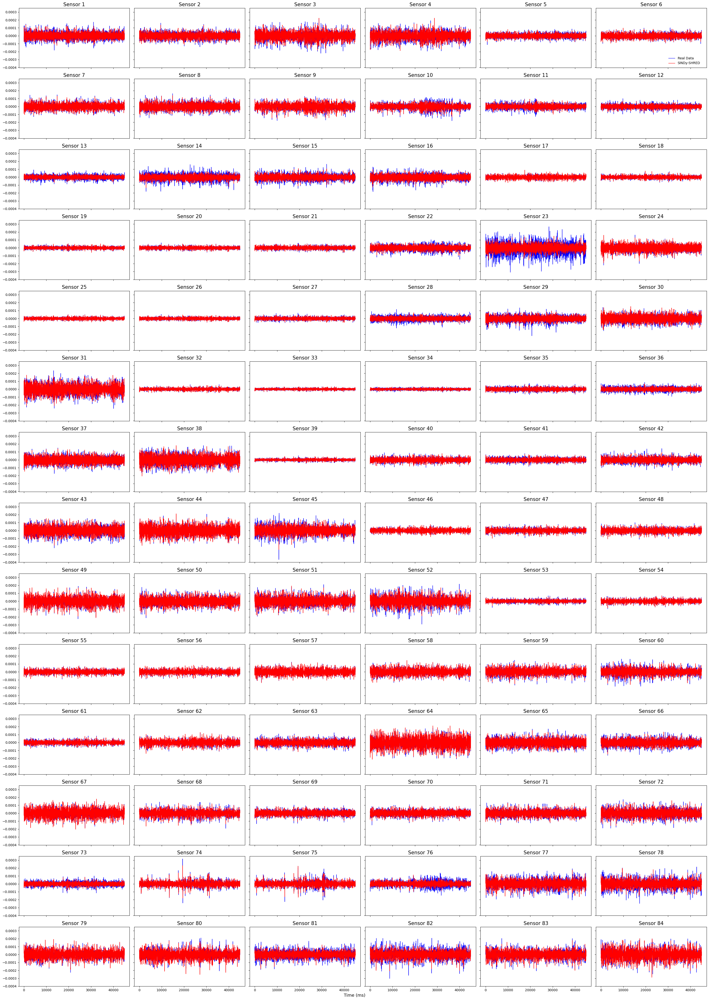

{'MSE': 3.5040814445354525e-10, 'MAE': 1.2950768440614287e-05, 'MeAE': 1.0563864857918556e-05, 'EV': 0.7483419973266411, 'R2': 0.7477956068105657}


In [ ]:
K = model.model.steps[-1][1].coef_
sensor_datas, error, K_updated = online_Koopman(K, shred, learning_rate=1, plot=True, errors=True)

### 4.2. Running time performance assessment

**online_Koopman_LATENCY**. A variant of online_Koopman, this function recursively computes the necessary prediction-update steps, measuring and averaging the necessary running time as to assess whole process' latency.

In [ ]:
def online_Koopman_LATENCY(K0, shred, train=True, num_trials=300, learning_rate=1, sensor_dim=84, stamp=True):
  """
    Predict and update the discovered Koopman operator, measuring unavoidable
    time latency averaged between runs

    Args:
      K0 (numpy.ndarray): initial Koopman operator. It is extrapolated from the
        SINDy model.
      shred (sindy_shred): SINDy-SHRED model.
      train (bool): If true, update the Koopman operator.
      num_trials (int): number of recursive steps over which average the latency
      learning_rate (float): learning rate for the RMSProp optimizer.
      sensor_dim (int): number of real states.
      stamp (bool): If true, print the average latency.

    Returns:
      latency_sum (float): average latency
  """

  for param in shred.parameters():                                                # Unchanged
    param.requires_grad = False                                                   # ...
  K_torch = torch.tensor(K0, dtype=torch.float32, device=device,                  # ...
                         requires_grad=True)                                      # ...
  optimizer = optim.RMSprop([K_torch],                                            # ...
                         lr=learning_rate, alpha=0.9)                             # ...
  sensor_pred_data = np.zeros((sensor_dim, num_trials))                           # ...
  sensor_real_data = sc.inverse_transform(test_dataset.Y.detach().cpu().numpy())  # ...
  sensor_normal_data = test_dataset.Y.detach().cpu().numpy()                      # ...

  # LATENCY COMPUTING ----------------------------------------------------------

  latency_sum = 0                                                                 # Latency sum pre allocation
  for i in range(0, num_trials - 1):                                              # For as many steps as required ...
    start = time.perf_counter()                                                   # ... start the timer
    x = test_dataset.X[i].unsqueeze(0)                                            # ... Unchanged
    x_hat_next, x_hat_next_np = predict(K_torch, shred, x)                        # ...
    sensor_pred_data[:,i] = sc.inverse_transform(x_hat_next_np)                   # ...
    if train:                                                                     # ... If train is True ...
      x_next = torch.FloatTensor(sensor_normal_data[i+1].reshape(1,-1)).to(device)# ...... Unchanged
      update_K_stepwise_gru_based(K_torch, x_next, x_hat_next, optimizer)         # ...... Unchanged
    end = time.perf_counter()                                                     # ... stop the timer
    latency_sum += end - start                                                    # ... sum the newly obtained latency score

  latency_sum = latency_sum/num_trials                                            # Average over the number of repetitions
  if stamp:                                                                       # If stamp is True ...
    print(latency_sum)                                                            # Print the average latency

  # ----------------------------------------------------------------------------

  return latency_sum

**Test the fitted Koopman prediction and update algorithm latency**

In [ ]:
K = model.model.steps[-1][1].coef_
latency = online_Koopman_LATENCY(K, shred, stamp=True)

0.00469818367001911


## Appendix. Paper models performance and plots

As mentioned in the paper, some informations (as the enormous Koopman matrix) is reported in the following code for each of the three selected models (26, 84, 140 dimensional), along with their plot and error performances.

NB. EXCECUTION OF NECESSARY IMPORT AND DATASET RETRIEVALS IS NECESSARY.

### 26-dimensional

(x0)' = -0.085 1 + 57.379 x0 + 53.944 x1 + 53.250 x2 + 57.162 x3 + 50.119 x4 + 33.603 x5 + 54.478 x6 + 58.686 x7 + 54.454 x8 + 50.221 x9 + 52.063 x10 + 46.937 x11 + 43.435 x12 + 64.178 x13 + 67.480 x14 + 72.541 x15 + 65.023 x16 + 58.522 x17 + 55.355 x18 + 46.704 x19 + 51.283 x20 + 53.466 x21 + 49.054 x22 + 65.128 x23 + 59.238 x24 + 65.800 x25
(x1)' = 0.051 1 + 11.059 x0 + 10.838 x1 + 8.680 x2 + 9.713 x3 + 13.490 x4 + 11.893 x5 + 12.564 x6 + 11.690 x7 + 11.063 x8 + 12.257 x9 + 12.645 x10 + 11.457 x11 + 11.057 x12 + 9.350 x13 + 10.678 x14 + 7.300 x15 + 10.231 x16 + 11.802 x17 + 11.363 x18 + 12.215 x19 + 13.032 x20 + 11.539 x21 + 11.332 x22 + 10.650 x23 + 12.578 x24 + 13.720 x25
(x2)' = 0.144 1 + 58.489 x0 + 56.935 x1 + 53.954 x2 + 57.835 x3 + 51.082 x4 + 59.962 x5 + 53.679 x6 + 57.652 x7 + 59.395 x8 + 54.035 x9 + 55.585 x10 + 57.137 x11 + 53.619 x12 + 52.153 x13 + 57.042 x14 + 59.242 x15 + 55.640 x16 + 55.130 x17 + 51.619 x18 + 56.427 x19 + 56.484 x20 + 49.159 x21 + 57.428 x22 + 60.389 x

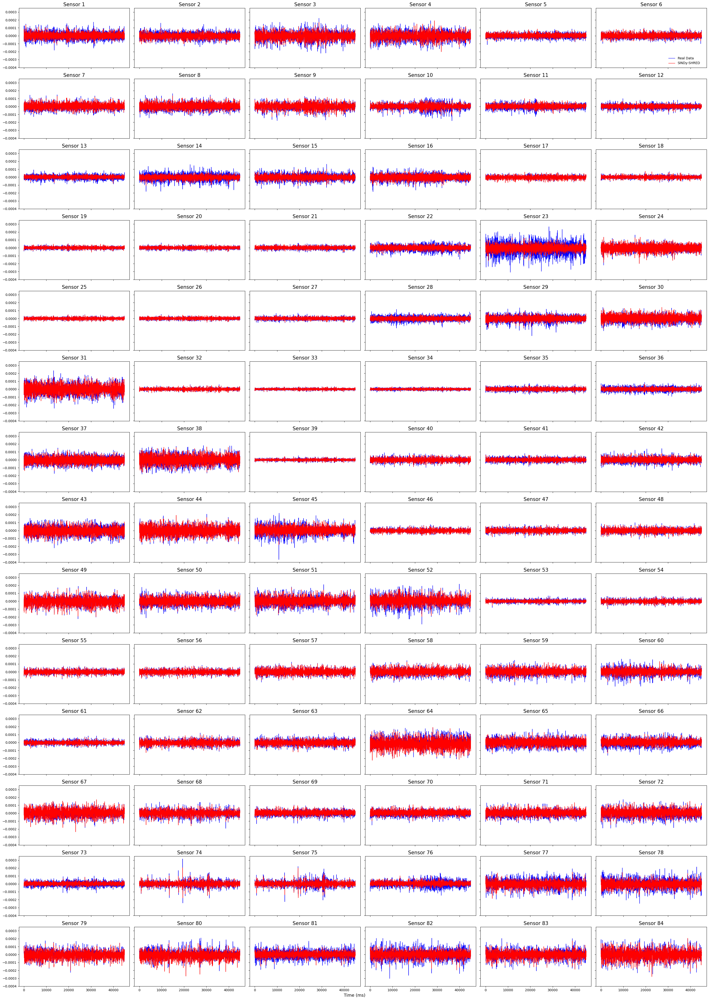

{'MSE': 4.105924159648348e-10, 'MAE': 1.403278253286328e-05, 'MeAE': 1.1447889795319844e-05, 'EV': 0.7142536663858249, 'R2': 0.7023900698826172}

■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■



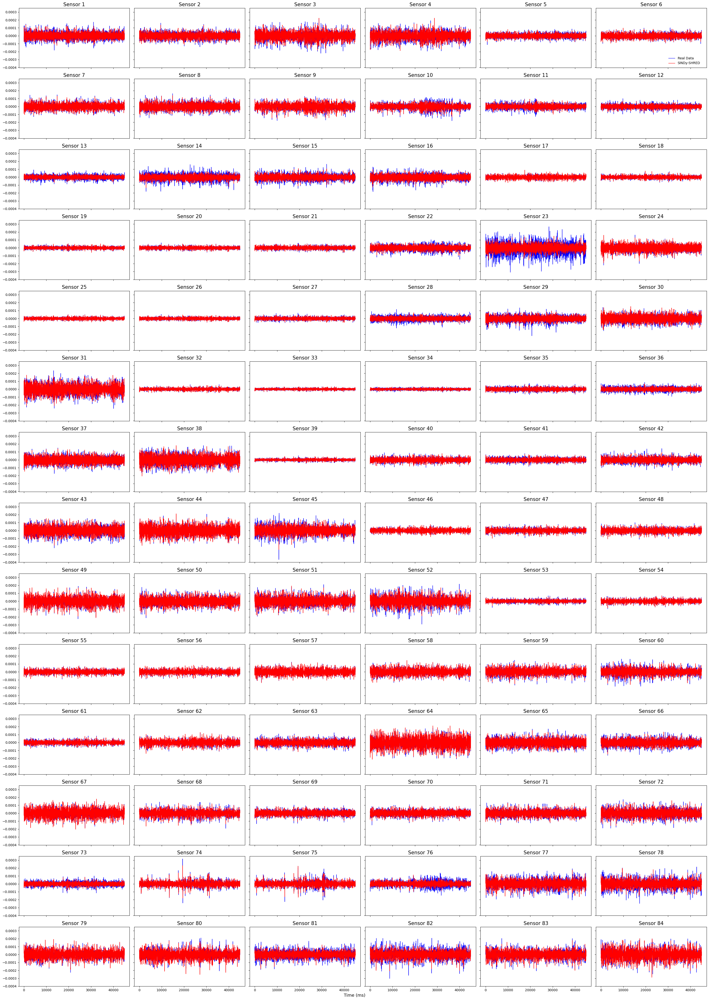

{'MSE': 3.5040814445354525e-10, 'MAE': 1.2950768440614287e-05, 'MeAE': 1.0563864857918556e-05, 'EV': 0.7483419973266411, 'R2': 0.7477956068105657}


In [ ]:
# LOAD SHRED AND FITTED MODEL --------------------------------------------------

with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\sindy_model___26___STLSQ___0.0___0.02___FiniteDifference()___.pkl", 'rb') as f:
  model_26 = torch.load(f)
with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\shred___84___2___26___0.1___False___350___400___0.001953125___False___100___200___0.0015___0.25___5___10.0___AdamW___100___.pkl", 'rb') as f:
  shred_26 = torch.load(f)

# PRINT THE REGRESSED KOOPMAN OPERATOR (LINEAR DYNAMICAL SYSTEM FORM) ----------

model_26.print()

# PLOT TEST AND ERROR PERFORMANCES OF CLASSICAL KOOPMAN-SHRED ------------------

print("")
print("■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■")
print("")

K_26 = model_26.model.steps[-1][1].coef_
sensor_datas, error, _ = online_Koopman(K_26, shred_26, num_train=0, plot=True, errors=True)

print("")
print("■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■")
print("")

# PLOT TEST AND ERROR PERFORMANCES OF ONLINE KOOPMAN-SHRED ---------------------

K_26 = model_26.model.steps[-1][1].coef_
sensor_datas, error, _ = online_Koopman(K_26, shred_26, plot=True, errors=True)

### 84-dimensional

(x0)' = 0.015 1 + 32.596 x0 + 7.063 x1 + 9.104 x2 + 19.620 x3 + 34.524 x4 + 32.385 x5 + 25.816 x6 + 36.949 x7 + 10.580 x8 + 6.749 x9 + 35.144 x10 + 1.988 x11 + 2.895 x12 + 28.730 x13 + 19.914 x14 + 18.340 x15 + 25.306 x16 + 7.985 x17 + 36.395 x18 + 2.525 x19 + 16.703 x20 + 21.825 x21 + 14.175 x22 + 15.429 x23 + 33.128 x24 + 24.029 x25 + -1.670 x26 + 18.208 x27 + 7.709 x28 + 37.330 x29 + 10.850 x30 + 11.015 x31 + 29.461 x32 + 41.075 x33 + 0.466 x34 + 18.934 x35 + 7.505 x36 + 25.333 x37 + 10.357 x38 + -4.091 x39 + 28.524 x40 + 2.210 x41 + -3.748 x42 + 6.045 x43 + 8.528 x44 + 14.822 x45 + 22.479 x46 + -3.225 x47 + 3.526 x48 + 18.487 x49 + 23.241 x50 + 2.023 x51 + 9.718 x52 + 16.510 x53 + 33.475 x54 + 12.536 x55 + 26.563 x56 + 21.197 x57 + 24.074 x58 + 19.015 x59 + 0.159 x60 + 32.037 x61 + 20.923 x62 + 38.084 x63 + -8.336 x64 + 6.456 x65 + 8.280 x66 + 17.365 x67 + 6.390 x68 + 8.637 x69 + 8.095 x70 + 25.134 x71 + 17.069 x72 + 17.883 x73 + -0.070 x74 + 5.091 x75 + 6.389 x76 + -1.800 x77 + 21

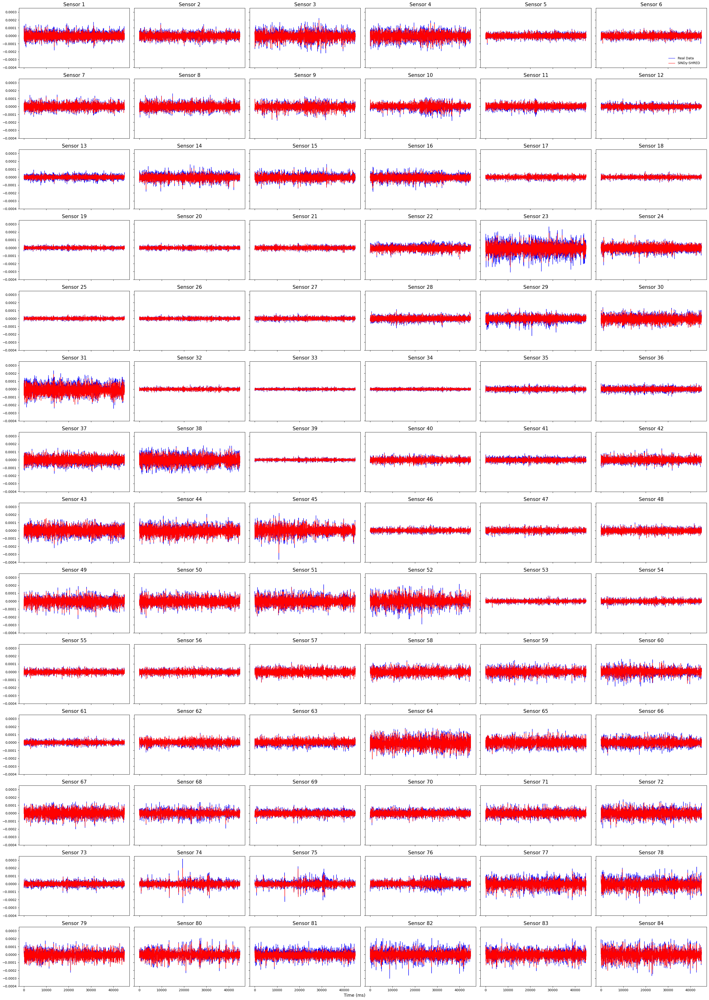

{'MSE': 1.303760476159482e-10, 'MAE': 8.034299687422567e-06, 'MeAE': 6.596568281582092e-06, 'EV': 0.9100563505771152, 'R2': 0.9034082942143921}

■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■



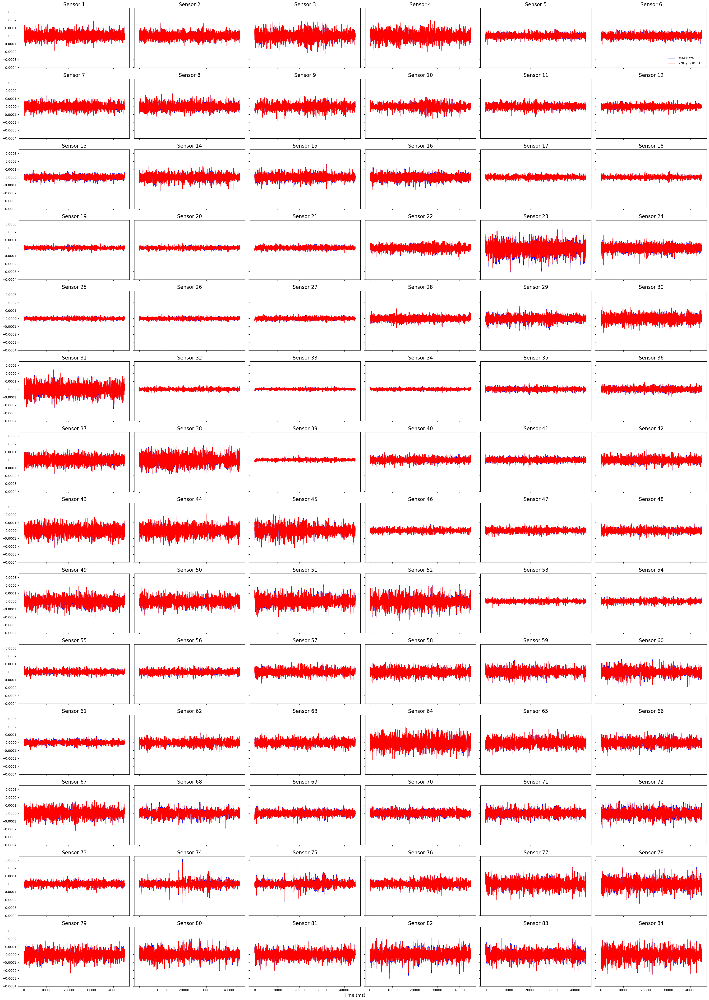

{'MSE': 7.917804519808784e-11, 'MAE': 6.284068998838721e-06, 'MeAE': 5.1715667079103396e-06, 'EV': 0.9384782547397987, 'R2': 0.9382412264858224}


In [ ]:
# LOAD SHRED AND FITTED MODEL --------------------------------------------------

with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\sindy_model___84___STLSQ___0.0___0.02___FiniteDifference()___.pkl", 'rb') as f:
  model_84 = torch.load(f)
with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\shred___84___2___84___0.1___False___350___400___0.001953125___False___100___200___0.0015___0.25___5___10.0___AdamW___100___.pkl", 'rb') as f:
  shred_84 = torch.load(f)

# PRINT THE REGRESSED KOOPMAN OPERATOR (LINEAR DYNAMICAL SYSTEM FORM) ----------

model_84.print()

# PLOT TEST AND ERROR PERFORMANCES OF CLASSICAL KOOPMAN-SHRED ------------------

print("")
print("■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■")
print("")

K_84 = model_84.model.steps[-1][1].coef_
sensor_datas, error, _ = online_Koopman(K_84, shred_84, num_train=0, plot=True, errors=True)

print("")
print("■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■")
print("")

# PLOT TEST AND ERROR PERFORMANCES OF ONLINE KOOPMAN-SHRED ---------------------

K_84 = model_84.model.steps[-1][1].coef_
sensor_datas, error, _ = online_Koopman(K_84, shred_84, plot=True, errors=True)

### 140-dimensional

(x0)' = 2.045 1 + 126.272 x0 + -7.419 x1 + -62.653 x2 + -24.391 x3 + -91.065 x4 + 95.716 x5 + 32.584 x6 + 0.046 x7 + -76.777 x8 + -2.229 x9 + -46.369 x10 + -105.868 x11 + -100.746 x12 + 19.589 x13 + -46.737 x14 + -114.633 x15 + 74.051 x16 + -49.258 x17 + 48.829 x18 + -60.012 x19 + -6.820 x20 + 16.359 x21 + 10.884 x22 + -6.931 x23 + 48.457 x24 + 39.664 x25 + 97.383 x26 + 45.932 x27 + -123.379 x28 + 7.074 x29 + 30.128 x30 + -45.840 x31 + 1.307 x32 + 1.188 x33 + -93.815 x34 + -9.930 x35 + -10.010 x36 + -75.112 x37 + -20.624 x38 + 16.145 x39 + -121.354 x40 + -42.266 x41 + -29.828 x42 + -17.760 x43 + 21.921 x44 + 89.199 x45 + -38.373 x46 + 112.334 x47 + 117.102 x48 + 24.510 x49 + 6.295 x50 + 80.871 x51 + -95.961 x52 + 130.135 x53 + 10.345 x54 + -3.355 x55 + -28.467 x56 + 3.434 x57 + -34.506 x58 + 55.480 x59 + 176.352 x60 + 82.693 x61 + -71.243 x62 + 116.560 x63 + 19.181 x64 + 1.463 x65 + 159.777 x66 + -141.324 x67 + -30.270 x68 + 108.674 x69 + 3.618 x70 + 11.126 x71 + 87.141 x72 + 4.428 x73

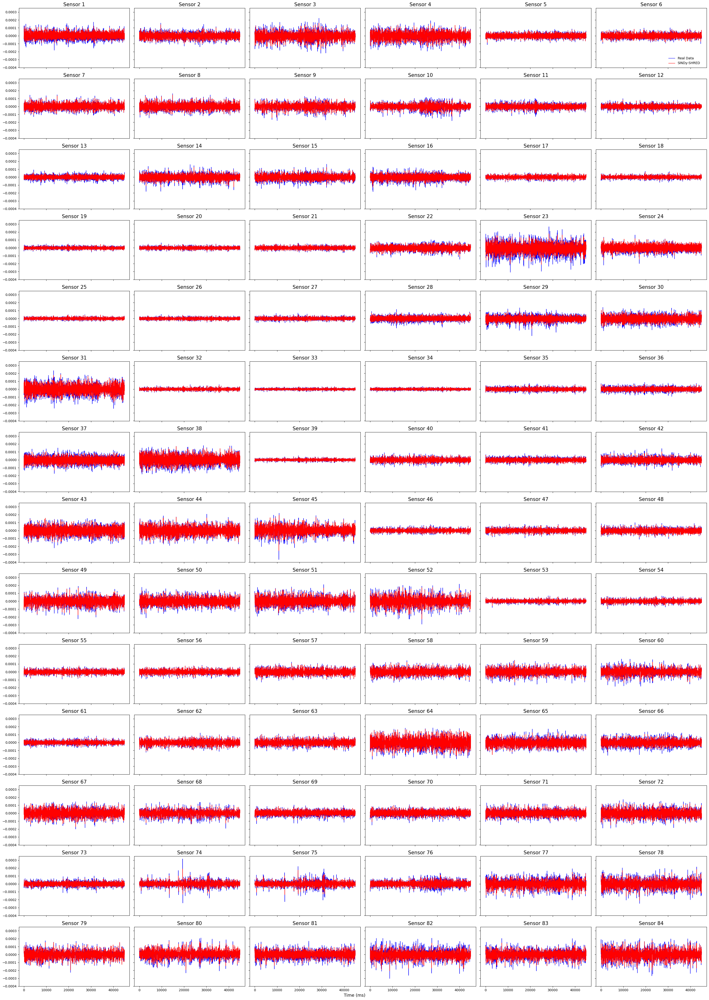

{'MSE': 1.2299050407379977e-10, 'MAE': 7.724163058798012e-06, 'MeAE': 6.1710956074312845e-06, 'EV': 0.9111589939439467, 'R2': 0.9072397727405036}

■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■



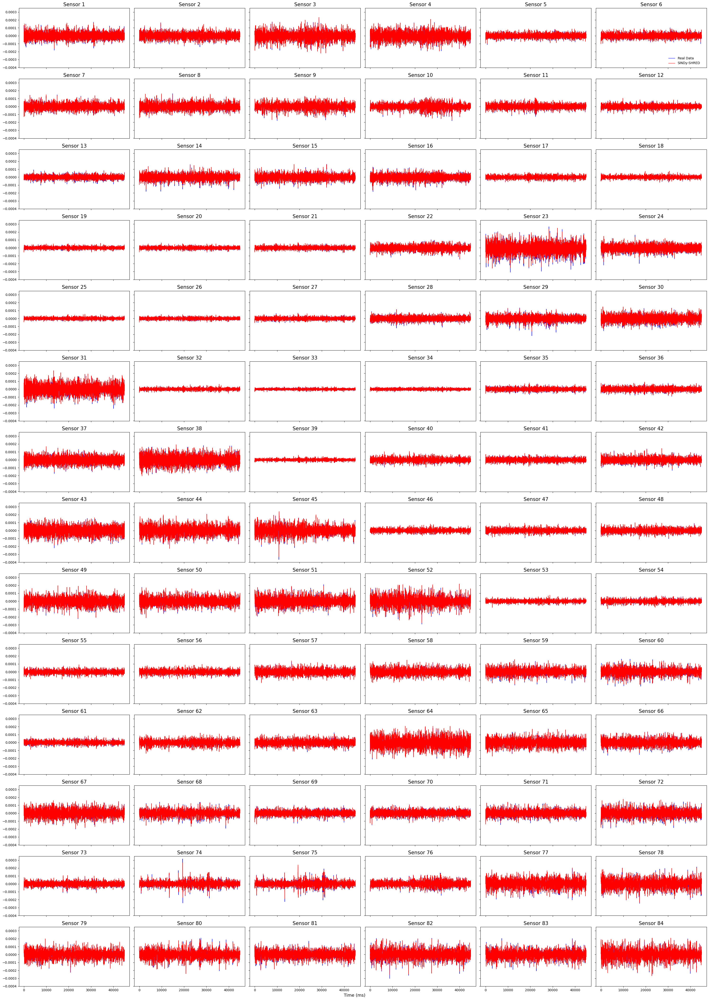

{'MSE': 8.646710576378146e-11, 'MAE': 6.603016455822483e-06, 'MeAE': 5.34125274870554e-06, 'EV': 0.9321329878289695, 'R2': 0.9318733310838146}


In [ ]:
# LOAD SHRED AND FITTED MODEL --------------------------------------------------

with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\sindy_model___140___STLSQ___0.0___0.02___FiniteDifference()___.pkl", 'rb') as f:
  model_140 = torch.load(f)
with open("C:\\Users\\mlanc\\Desktop\\KoopmanDataMaintainance\\Datasets\\sub-HUP087\\shred___84___2___140___0.1___False___350___400___0.001953125___False___1000___200___0.0015___0.25___5___10.0___AdamW___100___.pkl", 'rb') as f:
  shred_140 = torch.load(f)

# PRINT THE REGRESSED KOOPMAN OPERATOR (LINEAR DYNAMICAL SYSTEM FORM) ----------

model_140.print()

# PLOT TEST AND ERROR PERFORMANCES OF CLASSICAL KOOPMAN-SHRED ------------------

print("")
print("■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■")
print("")

K_140 = model_140.model.steps[-1][1].coef_
sensor_datas, error, _ = online_Koopman(K_140, shred_140, num_train=0, plot=True, errors=True)

print("")
print("■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■")
print("")

# PLOT TEST AND ERROR  PERFORMANCES OF ONLINE KOOPMAN-SHRED --------------------

K_140 = model_140.model.steps[-1][1].coef_
sensor_datas, error, _ = online_Koopman(K_140, shred_140, plot=True, errors=True)